In [ ]:
import io
import os
import re
import string
import numpy as np
import tensorflow as tf
from tensorflow import keras

from datetime import datetime
from tensorflow.keras import Model, Sequential, layers
from tensorflow.keras.layers import Activation, Dense, Embedding, GlobalAveragePooling1D, Lambda
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

from tensorflow.keras.preprocessing import text
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing import sequence

In [ ]:
%load_ext tensorboard
# Clear any logs from previous runs
!rm -rf ./logs/ 

In [ ]:
url = "https://s3.amazonaws.com/research.metamind.io/wikitext/wikitext-2-v1.zip"

dataset = tf.keras.utils.get_file("wikitext-2-v1.zip", url,
                                    extract=True, cache_dir='.',
                                    cache_subdir='')

In [ ]:
dataset_dir = os.path.join(os.path.dirname(dataset), 'wikitext-2/')
os.listdir(dataset_dir)

train_data = os.path.join(os.path.dirname(dataset_dir), 'wiki.train.tokens')
test_data = os.path.join(os.path.dirname(dataset_dir), 'wiki.test.tokens')
valid_data = os.path.join(os.path.dirname(dataset_dir), 'wiki.valid.tokens')

In [ ]:
wholedata = io.open(test_data, encoding='UTF-8').read().strip().split('\n')
data = wholedata[:500]

In [ ]:
tokenizer = text.Tokenizer(filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n', lower=True, split=' ', char_level=False)
tokenizer.fit_on_texts(data)
word2id = tokenizer.word_index

word2id['PAD'] = 0
id2word = {v:k for k, v in word2id.items()}
wids = [[word2id[w] for w in text.text_to_word_sequence(doc)] for doc in data]

vocab_size = len(word2id)
embed_size = 100
window_size = 2 # context window size

print('Vocabulary Size:', vocab_size)
print('Vocabulary Sample:', list(word2id.items())[10:])

Vocabulary Size: 4062
Vocabulary Sample: [('by', 11), ("'s", 12), ('were', 13), ('as', 14), ('that', 15), ('north', 16), ('he', 17), ('from', 18), ('his', 19), ('for', 20), ('had', 21), ('division', 22), ('it', 23), ('with', 24), ('company', 25), ('infantry', 26), ('us', 27), ('its', 28), ('this', 29), ('an', 30), ('korean', 31), ('they', 32), ('their', 33), ('which', 34), ('du', 35), ('one', 36), ('2nd', 37), ('river', 38), ('fu', 39), ('during', 40), ('km', 41), ('is', 42), ('two', 43), ('koreans', 44), ('but', 45), ('battalion', 46), ('all', 47), ('september', 48), ('1', 49), ('be', 50), ('after', 51), ('2', 52), ('also', 53), ('only', 54), ('position', 55), ('3', 56), ('hill', 57), ('ships', 58), ('attack', 59), ('not', 60), ('or', 61), ('5', 62), ('9th', 63), ('there', 64), ('time', 65), ('first', 66), ('who', 67), ('when', 68), ('into', 69), ('group', 70), ('000', 71), ('battle', 72), ('american', 73), ('h', 74), ('–', 75), ('fire', 76), ('ft', 77), ('force', 78), ('both', 79), (

In [ ]:
def generate_context_word_pairs(corpus=wids, window_size=window_size, vocab_size=vocab_size):
    context_length = window_size*2
    for words in corpus:
        sentence_length = len(words)
        for index, word in enumerate(words):
            context_words = []
            label_word   = []            
            start = index - window_size
            end = index + window_size + 1
            
            context_words.append([words[i] 
                                 for i in range(start, end) 
                                 if 0 <= i < sentence_length 
                                 and i != index])
            label_word.append(word)

            x = sequence.pad_sequences(context_words, maxlen=context_length)
            # y = to_categorical(label_word, vocab_size)
            y = label_word
            yield x, y

ds_series = tf.data.Dataset.from_generator(
    generate_context_word_pairs, 
    output_types=(tf.int32, tf.int32), 
    output_shapes=((None, None), (None)))

ds_series

<FlatMapDataset shapes: ((None, None), <unknown>), types: (tf.int32, tf.int32)>

In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

ds_series = ds_series.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
batch_size = 1000

In [ ]:
embedding_layer = layers.Embedding(input_dim=vocab_size, output_dim=embed_size, input_length=window_size*2)

model = Sequential()
model.add(embedding_layer)
model.add(GlobalAveragePooling1D())
model.add(Dense(vocab_size, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam')

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 4, 100)            406200    
_________________________________________________________________
global_average_pooling1d (Gl (None, 100)               0         
_________________________________________________________________
dense (Dense)                (None, 4062)              410262    
Total params: 816,462
Trainable params: 816,462
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = model.fit(ds_series, batch_size = window_size*2, epochs = 3)

Epoch 1/3
27615/27615 [==============================] - 155s 6ms/step - loss: 7.1230
Epoch 2/3
27615/27615 [==============================] - 144s 5ms/step - loss: 6.5335
Epoch 3/3
27615/27615 [==============================] - 145s 5ms/step - loss: 6.1589


In [ ]:
log_dir = "/logs/"
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

In [ ]:
from tensorboard.plugins import projector

with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
  for num, word in sorted(id2word.items()):
    if num == 0: continue 
    f.write("{}\n".format(word))


weights = tf.Variable(model.layers[0].get_weights()[0][1:])

checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

# Set up config
config = projector.ProjectorConfig()
embedding = config.embeddings.add()

embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)

### (Below click projector form dropdown to get display) 

In [ ]:
%tensorboard --logdir /logs/

<IPython.core.display.Javascript object>

In [ ]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 

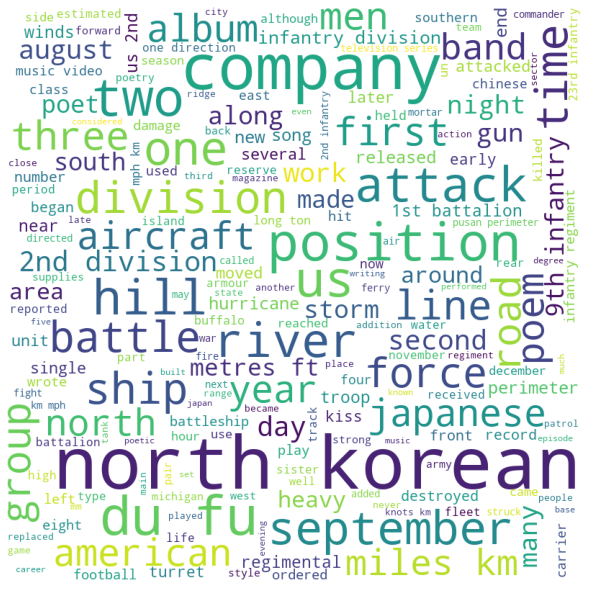

In [ ]:
comment_words = '' 
stopwords = set(STOPWORDS) 

stopwords.add('unk')

for val in data:       
    # typecaste each val to string 
    val = str(val)   
    # split the value 
    tokens = val.split()       
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()